In [433]:
import numpy as np
import pandas as pd
import scipy
import math
import os.path as path
import re
import sys, types

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap

from scipy.optimize import minimize
from scipy.stats import norm
from scipy.special import logsumexp

In [434]:
## install the required packages if not already installed
# !pip install remodnav numpy scipy pandas matplotlib -q
# !pip install --no-deps git+https://github.com/DiGyt/cateyes.git -q

# all the stupid things to bypass the cateyes dependency on nslr_hmm, which is not compatible here (and we dont use NSLR-HMM mmethod anyways)
nslr_stub = types.ModuleType('nslr_hmm')
nslr_stub.FIXATION = 1
nslr_stub.SACCADE = 2
nslr_stub.PSO = 3
nslr_stub.SMOOTH_PURSUIT = 4
sys.modules['nslr_hmm'] = nslr_stub
sys.modules['nslr'] = types.ModuleType('nslr')

from cateyes import classify_velocity, classify_dispersion, classify_remodnav, pixel_to_degree, continuous_to_discrete, discrete_to_continuous, plot_segmentation, plot_trajectory

In [435]:
# load the data
datapath = '/Users/qianyueli/Documents/UniStuttgart/26SU/EyeTracking/Project/pilot2/pilot2_data'
events_data = pd.read_csv(path.join(datapath, 'subject-1.csv'), sep=',', header=0)
et_data = pd.read_csv(path.join(datapath, 'subject-1.tsv'), sep='\t', header=0)

In [436]:
# meta data
RESOLUTION = [2560, 1440] 
SCREEN_SIZE = [59.69, 34.29]  # inches (27 inches screen (23.5, 13.5), 16:9 aspect ratio)
SMPL_RATE = 150 # Hz (the log file shows 60Hz but is incorrect)
DISTANCE = 60 # cm

In [437]:
events_data.head(5)

,AN,Code,RN,acc,accuracy,an_found,an_height,an_line,an_text,an_width,...,timestamp,title,total_correct,total_response_time,total_responses,width,word,word_height,word_spacing,word_width
0,<AN>Männer</AN>,C3,<RN>Arbeitnehmerinnen</RN>,undefined,undefined,True,53,4,<AN>Männer</AN>,135,...,45864.9747,Experiment,0,0,0,1920,Diskussionen.,53,25,289
1,<AN>Frauen</AN>,C6,<RN>Student*innen</RN>,undefined,undefined,True,53,4,<AN>Männer</AN>,135,...,45864.9747,Experiment,0,0,0,1920,Diskussionen.,53,25,289
2,<AN>Frauen</AN>,C2,<RN>Pfleger</RN>,undefined,undefined,True,53,4,<AN>Männer</AN>,135,...,45864.9747,Experiment,0,0,0,1920,Diskussionen.,53,25,289
3,<AN>Männer</AN>,C6,<RN>Ingenieur*innen</RN>,undefined,undefined,True,53,4,<AN>Männer</AN>,135,...,45864.9747,Experiment,0,0,0,1920,Diskussionen.,53,25,289
4,<AN>Männer</AN>,C3,<RN>Studentinnen</RN>,undefined,undefined,True,53,4,<AN>Männer</AN>,135,...,45864.9747,Experiment,0,0,0,1920,Diskussionen.,53,25,289


In [438]:
# select for the correct list (4 used for pilot)
events_data_list4 = events_data[events_data['list'] == 4].reset_index(drop=True)
print(events_data_list4)

                 AN Code                          RN        acc   accuracy  \
0   <AN>Männer</AN>   C3  <RN>Arbeitnehmerinnen</RN>  undefined  undefined   
1   <AN>Frauen</AN>   C4        <RN>Expertinnen</RN>  undefined  undefined   
2   <AN>Männer</AN>   C1     <RN>Krankenpfleger</RN>  undefined  undefined   
3   <AN>Frauen</AN>   C2         <RN>Aktivisten</RN>  undefined  undefined   
4   <AN>Männer</AN>   C5    <RN>Einwohner*innen</RN>  undefined  undefined   
5   <AN>Männer</AN>   C1           <RN>Experten</RN>  undefined  undefined   
6   <AN>Männer</AN>   C2         <RN>Ingenieure</RN>  undefined  undefined   
7   <AN>Frauen</AN>   C6    <RN>Ingenieur*innen</RN>  undefined  undefined   
8   <AN>Frauen</AN>   C2       <RN>Arbeitnehmer</RN>  undefined  undefined   
9   <AN>Männer</AN>   C5       <RN>Expert*innen</RN>  undefined  undefined   
10  <AN>Frauen</AN>   C4       <RN>Studentinnen</RN>  undefined  undefined   
11  <AN>Männer</AN>   C3      <RN>Polizistinnen</RN>  undefined 

In [439]:
et_data.tail(5)

,CNT,TIME,TIME_TICK,FPOGX,FPOGY,FPOGS,FPOGD,FPOGID,FPOGV,LPOGX,...,LPUPILV,REYEX,REYEY,REYEZ,RPUPILD,RPUPILV,CX,CY,CS,USER
69189,675680,4588.21777,2273003552218,0.45652,0.58149,4588.02637,0.16748,11350,0,0.34444,...,1,0.05891,0.01639,0.61917,0.00503,1,1.47969,0.21528,0,NaN
69190,675681,4588.22070,2273003581162,0.38142,0.57604,4588.02637,0.16748,11350,0,0.36643,...,1,0.05891,0.01639,0.61917,0.00504,1,1.47969,0.21528,0,NaN
69191,675682,4588.22754,2273003648310,0.37851,0.56666,4588.02637,0.16748,11350,0,0.36756,...,1,0.05955,0.01655,0.62691,0.00502,1,1.47969,0.21528,0,NaN
69192,675683,4588.23389,2273003715428,0.37747,0.56626,4588.02637,0.16748,11350,0,0.35836,...,1,0.05955,0.01655,0.62691,0.00502,1,1.47969,0.21528,0,NaN
69193,675684,4588.24072,2273003782446,0.37642,0.56690,4588.22070,0.02002,11351,1,0.36052,...,1,0.05955,0.01655,0.62691,0.00502,1,1.47969,0.21528,0,STOP_TRIAL


In [440]:
# to extract samples from each sentences (between sentence onset and question onset)
starts = et_data.index[et_data['USER']=='SENTENCE_ONSET'].tolist()
print(starts)
ends = et_data.index[et_data['USER']=='TEXT_ONSET'].tolist()
print(ends)


sentence_chunks = []
for i, (start, end) in enumerate(zip(starts, ends)):
    chunk = et_data.iloc[start:end].copy()
    chunk['SENTENCE_INDEX'] = i    # assign the sentence index
    sentence_chunks.append(chunk)


sentence_df = pd.concat(sentence_chunks).reset_index(drop=True)
sentence_df.tail()

[525, 3753, 7799, 11475, 15558, 19515, 22632, 25586, 29543, 33863, 37710, 41918, 45116, 50055, 54081, 57761, 62056, 65678]
[3372, 7414, 11081, 15197, 19228, 22231, 25152, 29148, 33486, 37344, 41568, 44746, 49627, 53681, 57393, 61605, 65336, 68916]


,CNT,TIME,TIME_TICK,FPOGX,FPOGY,FPOGS,FPOGD,FPOGID,FPOGV,LPOGX,...,REYEX,REYEY,REYEZ,RPUPILD,RPUPILV,CX,CY,CS,USER,SENTENCE_INDEX
61896,675402,4586.35205,2272984893379,0.55096,0.56984,4586.23145,0.12061,11342,1,0.42640,...,0.06544,0.01618,0.62345,0.00528,1,1.47969,0.21528,0,NaN,17
61897,675403,4586.35840,2272984959786,0.54599,0.56910,4586.23145,0.12695,11342,1,0.42714,...,0.06529,0.01634,0.62605,0.00513,1,1.47969,0.21528,0,NaN,17
61898,675404,4586.36523,2272985027270,0.53685,0.56622,4586.23145,0.13379,11342,1,0.34911,...,0.06529,0.01634,0.62605,0.00529,1,1.47969,0.21528,0,NaN,17
61899,675405,4586.37207,2272985094591,0.50200,0.55125,4586.23145,0.13379,11342,0,0.29503,...,0.06529,0.01634,0.62605,0.00523,1,1.47969,0.21528,0,NaN,17
61900,675406,4586.37842,2272985161277,0.40079,0.54057,4586.23145,0.13379,11342,0,0.29367,...,0.06465,0.01630,0.62261,0.00516,1,1.47969,0.21528,0,NaN,17


In [441]:
# turn the invalid data points into NaN
# why not just drop: to preserve the sampling rate, safer interpolation, etc.
base_invalid = (
    (sentence_df['BPOGV'] != 1) |
    (sentence_df['BPOGX'] < -0.05) | (sentence_df['BPOGX'] > 1.05) |
    (sentence_df['BPOGY'] < -0.05) | (sentence_df['BPOGY'] > 1.05)
)
padded_invalid = base_invalid.rolling(window=7, center=True, min_periods=1).max().astype(bool)     #remove those next to the invalid data
sentence_df.loc[padded_invalid, ['BPOGX', 'BPOGY']] = np.nan


print(f"The percentage of invalid data is {(sum(np.isnan(sentence_df['BPOGX'].values))/len(sentence_df['BPOGX'])):.2%}")

The percentage of invalid data is 22.01%


In [442]:
# convert the normalized coordinates to pixel coordinates
sentence_df['X_px'] = sentence_df['BPOGX'] * RESOLUTION[0]
sentence_df['Y_px'] = sentence_df['BPOGY'] * RESOLUTION[1]

# center the coordinates at the mid of the screen (0,0)
sentence_df['X_px_center'] = sentence_df['BPOGX'] * RESOLUTION[0] - RESOLUTION[0] / 2
sentence_df['Y_px_center'] = sentence_df['BPOGY'] * RESOLUTION[1] - RESOLUTION[1] / 2

#convert pixel coordinates to visual degrees
gaze_px = np.vstack([sentence_df['X_px'].values,
                     sentence_df['Y_px'].values])          # shape (2, n_samples)
deg = pixel_to_degree(gaze_px, DISTANCE, SCREEN_SIZE, RESOLUTION)  # SCREEN_SIZE, RESOLUTION stay length-2
sentence_df['X_deg'] = deg[0]
sentence_df['Y_deg'] = deg[1]


In [443]:
# 1. Calculate the degree span, ignoring NaNs
deg_span = np.nanmax(sentence_df['X_deg'].values) - np.nanmin(sentence_df['X_deg'].values)

# 2. Calculate the pixel span, ignoring NaNs
px_span = np.nanmax(sentence_df['X_px'].values) - np.nanmin(sentence_df['X_px'].values)

# 3. Print the final ratio
print("Overall deg/px ratio:", deg_span / px_span)

Overall deg/px ratio: 0.020622415553857083


## Fixation Detection

In [444]:
# fixation detection
## wanted to use this one but the sampling rate is too low? need to check
# segments, classes, events = classify_remodnav(sentence_df['X_deg'].values, sentence_df['Y_deg'].values, sentence_df['TIME'].values, 1)
# threshold = 2.5, window = 1
fixation_method = 'I-VT'
if fixation_method == 'I-DT':
    segments, classes = classify_dispersion(sentence_df['X_deg'].values, sentence_df['Y_deg'].values, sentence_df['TIME'].values, 1, 1.5)
elif fixation_method == 'I-VT':
    segments, classes = classify_velocity(sentence_df['X_deg'].values, sentence_df['Y_deg'].values, sentence_df['TIME'].values)
sentence_df['segments'] = segments
sentence_df['classes'] = classes

/opt/homebrew/Caskroom/miniconda/base/envs/eyetrack/lib/python3.12/site-packages/cateyes/utils.py:365: UserWarning: 

Irregular sampling rate detected. This can lead to impaired performance with this classifier. Consider resampling your data to a fixed sampling rate. Setting sampling rate to average sample difference.
  warnings.warn(WARN_SFREQ)


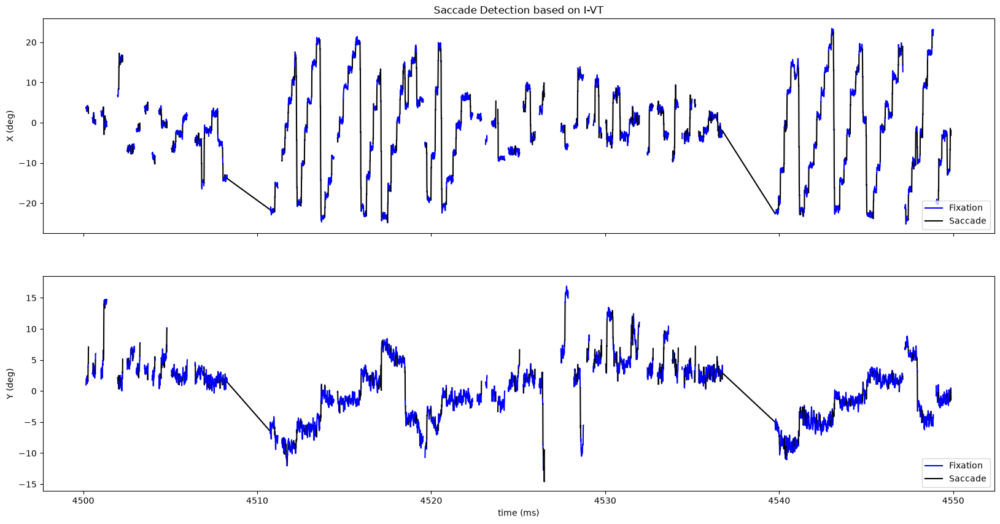

In [445]:
### select on for a chunk of data to plot
min_time = 4500 #ms
max_time = 4550
chunk_df = sentence_df[(sentence_df['TIME'] >= min_time) & (sentence_df['TIME'] <= max_time)].copy()

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10), sharex=True)

discrete_segments = continuous_to_discrete(chunk_df['TIME'].values, chunk_df['segments'].values, chunk_df['classes'].values)    #segment based instead of sample based for better illustration

# gaze x
plot_segmentation(
    chunk_df['X_deg'].values, 
    chunk_df['TIME'].values, 
    segments=discrete_segments, 
    ax=ax1
)
ax1.set_ylabel("X (deg)")

# gaze y
plot_segmentation(
    chunk_df['Y_deg'].values, 
    chunk_df['TIME'].values, 
    segments=discrete_segments, 
    ax=ax2
)
ax2.set_ylabel("Y (deg)")
ax2.set_xlabel("time (ms)")

ax1.set_title(f'Saccade Detection based on {fixation_method}')
plt.show()

In [446]:
### filter out saccades shorter than 3 samples (~20ms). typical saccade > 20ms
min_saccade_samples = 2

# fet segment lengths and get the indices of the short saccade segments
segment_lengths = sentence_df.groupby('segments').size()
short_saccades = segment_lengths[
    (segment_lengths < min_saccade_samples) & 
    (sentence_df.groupby('segments')['classes'].first() == 'Saccade')
].index

# relable them as fixation
sentence_df.loc[sentence_df['segments'].isin(short_saccades), 'classes'] = 'Unclassified'

In [447]:
### calculate the amplitud and velocity of the saccades
# filter out the saccade segments only
saccades = sentence_df[sentence_df['classes'] == 'Saccade']

# group to analyze each saccade event individually
saccade_groups = saccades.groupby('segments')
print(f"Total Saccades Detected: {len(saccade_groups)}")

amplitudes = []
peak_velocities = []

for seg_id, group in saccade_groups:
    #print(f"Segment ID: {seg_id}, Number of Points: {len(group)}")
    # get the amplitude from the euclidean distance from the first to the last point of the segment
    dx = group['X_deg'].iloc[-1] - group['X_deg'].iloc[0]
    dy = group['Y_deg'].iloc[-1] - group['Y_deg'].iloc[0]
    amplitude = np.sqrt(dx**2 + dy**2)
    
    # get the peak velocity
    vel_x = np.diff(group['X_deg'].values) / np.diff(group['TIME'].values)
    vel_y = np.diff(group['Y_deg'].values) / np.diff(group['TIME'].values)
    velocities = np.sqrt(vel_x**2 + vel_y**2)
    peak_vel = np.max(velocities)
    
    amplitudes.append(amplitude)
    peak_velocities.append(peak_vel)

ms_df = pd.DataFrame({
    'Amplitude': amplitudes,
    'PeakVelocity': peak_velocities
})

Total Saccades Detected: 989


Text(0.5, 1.0, 'Main Sequence Analysis (Log-Log)')

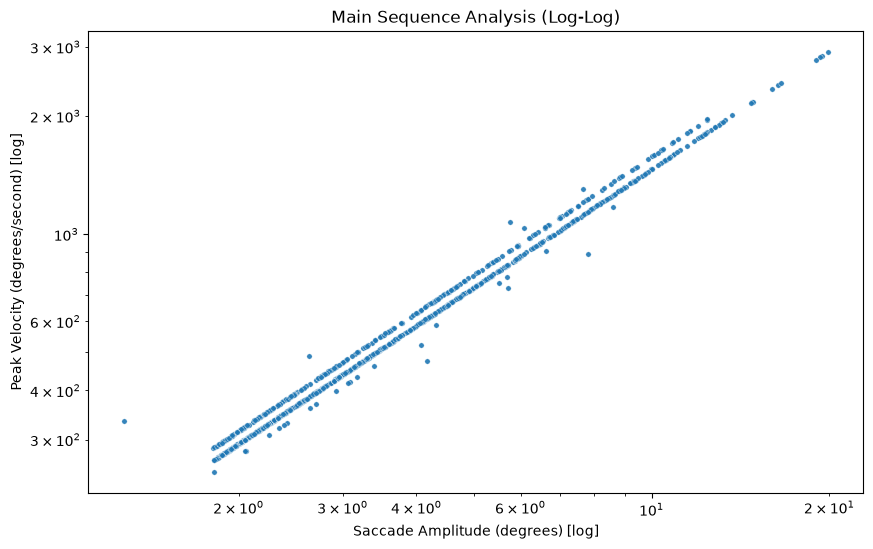

In [448]:
### plot the main sequence
plt.figure(figsize=(10, 6))

sns.scatterplot(data=ms_df, x='Amplitude', y='PeakVelocity', alpha=0.9, s=15)
plt.xscale('log')
plt.yscale('log')
plt.xlabel("Saccade Amplitude (degrees) [log]")
plt.ylabel("Peak Velocity (degrees/second) [log]")
plt.title("Main Sequence Analysis (Log-Log)")

#### small sanity check for velocity

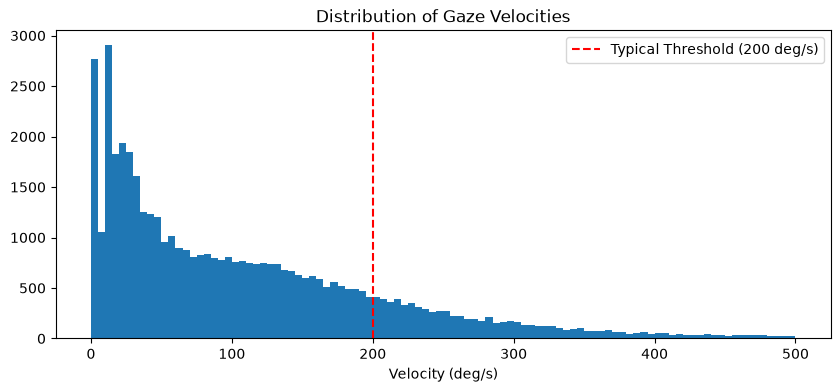

In [449]:
# plot the distribution of velocities of each gaze sample
dt = np.diff(sentence_df['TIME'].values)
dx = np.diff(sentence_df['X_deg'].values)
dy = np.diff(sentence_df['Y_deg'].values)
velocities = np.sqrt(dx**2 + dy**2) / dt

plt.figure(figsize=(10, 4))
plt.hist(velocities, bins=100, range=(0, 500))
plt.axvline(x=200, color='r', linestyle='--', label='Typical Threshold (200 deg/s)')
plt.title("Distribution of Gaze Velocities")
plt.xlabel("Velocity (deg/s)")
plt.legend()
plt.show()

Total Valid Fixations Found: 1639


/var/folders/t4/tpd64s9d2xb_cdt_fwtwlr480000gn/T/ipykernel_41396/1757608313.py:101: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


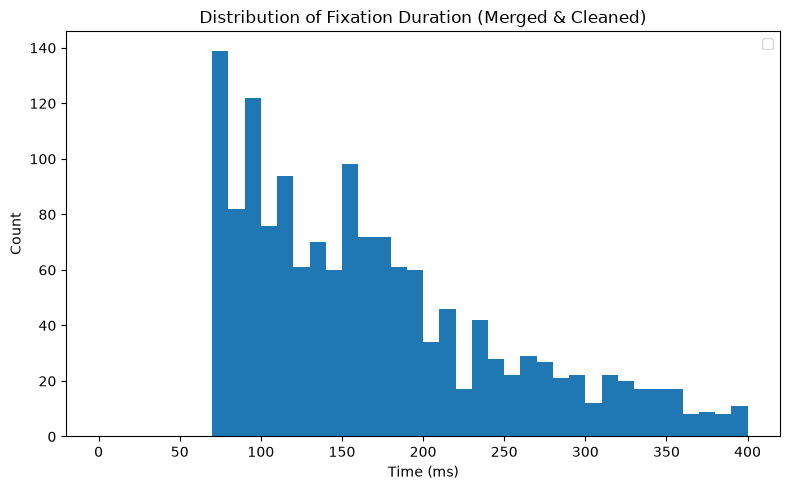

In [450]:


# ==========================================
# 1. SETUP & MERGE/DROP LOGIC
# ==========================================
# Create a safe copy of your data
df_clean = sentence_df.copy()

# Group the initial, raw fixations
initial_fixations = df_clean[df_clean['classes'] == 'Fixation']
fixation_groups = [group for _, group in initial_fixations.groupby('segments')]

current_start_t = None
current_end_t = None
last_x = None
last_y = None

valid_fixation_blocks = [] 

for group in fixation_groups:
    group_start = group['TIME'].iloc[0]
    group_end = group['TIME'].iloc[-1]
    
    # Using the RAW coordinates
    group_start_x = group['X_deg'].iloc[0] 
    group_start_y = group['Y_deg'].iloc[0]
    group_end_x = group['X_deg'].iloc[-1]
    group_end_y = group['Y_deg'].iloc[-1]
    
    if current_start_t is None:
        current_start_t = group_start
        current_end_t = group_end
        last_x = group_end_x
        last_y = group_end_y
        continue
        
    time_gap_ms = (group_start - current_end_t) * 1000
    spatial_gap_deg = np.sqrt((group_start_x - last_x)**2 + (group_start_y - last_y)**2)
    
    # MERGE CONDITION: < 30ms gap AND <= 1.0 degree spatial shift
    if time_gap_ms < 30 and spatial_gap_deg <= 1.0:
        current_end_t = group_end       
        last_x = group_end_x          
        last_y = group_end_y
    else:
        # DROP CONDITION: Must be >= 70ms to be a valid human fixation
        duration = (current_end_t - current_start_t) * 1000 + (1000 / 150)
        if duration >= 70: 
            valid_fixation_blocks.append((current_start_t, current_end_t))
            
        # Reset trackers for the next block
        current_start_t = group_start
        current_end_t = group_end
        last_x = group_end_x
        last_y = group_end_y
        
# Check the very last fixation block
if current_start_t is not None:
    duration = (current_end_t - current_start_t) * 1000 + (1000 / 150)
    if duration >= 70:
        valid_fixation_blocks.append((current_start_t, current_end_t))

print(f"Total Valid Fixations Found: {len(valid_fixation_blocks)}")


# ==========================================
# 2. RE-MARKING THE DATAFRAME
# ==========================================
# Demote all old, noisy fixations to 'Unclassified'
df_clean.loc[df_clean['classes'] == 'Fixation', 'classes'] = 'Unclassified'

# Promote our validated blocks back to 'Fixation' 
for start_t, end_t in valid_fixation_blocks:
    mask = (df_clean['TIME'] >= start_t) & (df_clean['TIME'] <= end_t)
    df_clean.loc[mask, 'classes'] = 'Fixation'

# Create fresh contiguous segment IDs so the plotting function can group them properly
df_clean['clean_segments'] = (df_clean['classes'] != df_clean['classes'].shift()).cumsum()

# after the re-marking block, propagate to the dataframe the measures actually use:
sentence_df['classes'] = df_clean['classes']
sentence_df['segments'] = df_clean['clean_segments']


# ==========================================
# 3. PLOTTING THE CLEANED HISTOGRAM
# ==========================================
final_fixations = df_clean[df_clean['classes'] == 'Fixation']
final_fix_groups = [group for _, group in final_fixations.groupby('clean_segments')]

final_durations = [(group['TIME'].iloc[-1] - group['TIME'].iloc[0]) * 1000 + (1000 / 150) for group in final_fix_groups]

plt.figure(figsize=(8, 5))
plt.hist(final_durations, bins=40, range=(0, 400))

# if final_durations:
#     median_dur = np.median(final_durations)
#     plt.axvline(median_dur, color='red', linestyle='dashed', linewidth=2, label=f'Median: {median_dur:.0f} ms')
    
plt.title("Distribution of Fixation Duration (Merged & Cleaned)")
plt.xlabel("Time (ms)")
plt.ylabel("Count")
plt.legend()
plt.tight_layout()
plt.show()

## Cohen's correction

## Text overlay

In [451]:
WRONG_RES = (1920, 1200)    # incorrect resolution used in polit 2. text position needs correction

In [452]:
def find_tail_cut(trial, text_box,
                         x_col='X_px_center', y_col='Y_px_center',
                         min_run=5, max_gap=3, trigger_offset=90, manual=0):
    """
    Cut the tail of the samples after the first sustained samples (number defined by min_run)
    that are below the cutoff margin (bottom line of the text box + self-defined margin)
    Returns last index to KEEP (or len-1 if never triggered).
    """
    y = trial[y_col].to_numpy(float)
    x1, x2, y1, y2 = text_box
    trigger_y = y2 + trigger_offset
    below = np.nan_to_num(y > trigger_y, nan=False).astype(bool)
    n = len(trial)

    i = 0
    while i < n:
        if below[i]:
            k, gap = i, 0
            while k < n and (below[k] or (np.isnan(y[k]) and gap < max_gap)):
                gap = gap + 1 if np.isnan(y[k]) else 0
                k += 1
            if (k - i) >= min_run:      # first sustained below-run
                return i - 1 - manual           # keep up to just before it
        i += 1
    return n - 1 - manual                        # never triggered: keep all

In [ ]:
from PIL import ImageFont
import matplotlib.font_manager as fm
from matplotlib import font_manager

# --- font setup (module level, once) ---
FONT_PATH = fm.findfont(fm.FontProperties(family='monospace'))   
_FONT_PIL = ImageFont.truetype(FONT_PATH, 39)
_FONT_PROP = font_manager.FontProperties(fname=FONT_PATH)

def layout_words_exact(row, sx, sy):
    word_sp = 24.0
    line_sp = 120.0
    tsx = float(row['text_start_x'])
    tsy = float(row['text_start_y'])
    boxw = float(row['box_width'])
    
    # Reverse-engineer the EXACT character width OpenSesame used
    rn_word_clean = re.sub(r'<[^>]+>', '', str(row['RN']))
    rn_width_px = float(row['rn_x2']) - float(row['rn_x1'])
    char_w = rn_width_px / len(rn_word_clean)
    
    sentence = re.sub(r'</?[A-Za-z*]+>', '', str(row['display_sentence']))
    
    px, py, placed = tsx, tsy, []
    
    for w in sentence.split():
        # OpenSesame calculates wrap width using the whole string (including punctuation)
        word_width = len(w) * char_w 
        
        # OpenSesame automatic line break check
        if (px - tsx) + word_width > boxw:
            px = tsx
            py += line_sp
            
        placed.append((w, px * sx, py * sy))
        
        # Advance the cursor for the next word
        px += word_width + word_sp
        
    return placed

In [454]:
def plot_gaze_with_time_gradient(sentence_i, word_h=45, margin=40, min_run=5, max_gap=3, trigger_offset=90, manual=0):
    row = events_data_list4.iloc[sentence_i]
    sx, sy = RESOLUTION[0]/WRONG_RES[0], RESOLUTION[1]/WRONG_RES[1]
    scale4 = np.array([sx, sx, sy, sy])
    
    # Extract and scale coordinates for all three boxes
    rn = row[['rn_x1','rn_x2','rn_y1','rn_y2']].astype(float) * scale4
    an = row[['an_x1','an_x2','an_y1','an_y2']].astype(float) * scale4
    spill = row[['spill_x1','spill_x2','spill_y1','spill_y2']].astype(float) * scale4

    tx1 = (float(row['text_start_x']) - margin) * sx
    tx2 = (float(row['text_start_x']) + float(row['box_width']) + margin) * sx
    ty1 = (float(row['text_start_y']) - margin) * sy
    ty2 = (float(row['last_line_y']) + word_h + margin) * sy
    text_box = (tx1, tx2, ty1, ty2)

    an_word = re.sub(r'<[^>]+>', '', str(row['AN']))
    rn_word = re.sub(r'<[^>]+>', '', str(row['RN'])) # Fixed missing parenthesis here!

    trial = (sentence_df[sentence_df['SENTENCE_INDEX']==sentence_i]
             .sort_values('TIME').reset_index(drop=True))
    keep_idx = find_tail_cut(trial, text_box, min_run=min_run, max_gap=max_gap, trigger_offset=trigger_offset, manual=manual)
    kept, tail = trial.iloc[:keep_idx+1], trial.iloc[keep_idx+1:]
    x = kept['X_px_center'].to_numpy(float); y = kept['Y_px_center'].to_numpy(float)
    t = (kept['TIME'].to_numpy(float) - kept['TIME'].min())

    fig, ax = plt.subplots(figsize=(15, 8.5)); ax.set_facecolor('#fafafa')
    ax.set_xlim(-RESOLUTION[0]/2, RESOLUTION[0]/2)
    ax.set_ylim(-RESOLUTION[1]/2, RESOLUTION[1]/2)
    ax.invert_yaxis()

    # size text from the logged word height
    fig.canvas.draw()
    target_h = word_h * sy
    p0 = ax.transData.transform((0,0)); p1 = ax.transData.transform((0, target_h))
    font_pt = abs(p1[1]-p0[1]) * 72.0 / fig.dpi

    # Draw the background text
    for w, wx, wy in layout_words_exact(row, sx, sy):
        ax.text(wx, wy, w, 
                fontproperties=_FONT_PROP,  
                fontsize=font_pt,        
                ha='left',               
                va='top',                
                color='0.8', 
                zorder=0)

    # Pin RN/AN to exact box centres
    for pfx, wtxt in [('rn', rn_word), ('an', an_word)]:
        cx = (float(row[f'{pfx}_x1'])+float(row[f'{pfx}_x2']))/2 * sx
        cy = (float(row[f'{pfx}_y1'])+float(row[f'{pfx}_y2']))/2 * sy
        
        ax.text(cx, cy, wtxt, fontproperties=_FONT_PROP, fontsize=font_pt,
                ha='center', va='center_baseline', color='0.25', fontweight='bold', zorder=1)

    # Gray lines for the excluded tail data
    ax.plot(tail['X_px_center'], tail['Y_px_center'],
            color='0.6', lw=1.5, alpha=0.5, zorder=1, label='removed (tail)')

    # Gaze plotting
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    cmap = LinearSegmentedColormap.from_list("t", ["#2c7bb6", "#ffff8c", "#d7191c"])
    lc = LineCollection(segments, cmap=cmap, norm=plt.Normalize(0, t.max()),
                        linewidth=1.8, alpha=0.75, zorder=3)
    lc.set_array(t[:-1]); ax.add_collection(lc)
    cbar = fig.colorbar(lc, ax=ax, pad=0.01, fraction=0.046)
    cbar.set_label('time since text onset (s)')

    # --- AOI Boxes ---
    # Text box (dashed gray)
    ax.add_patch(Rectangle((text_box[0], text_box[2]), text_box[1]-text_box[0],
                 text_box[3]-text_box[2], lw=1.2, ls='--',
                 edgecolor='0.5', facecolor='none', zorder=2, label='text box'))
    
    # RN Box (Green)
    ax.add_patch(Rectangle((rn['rn_x1'], rn['rn_y1']), rn['rn_x2']-rn['rn_x1'],
                 rn['rn_y2']-rn['rn_y1'], lw=2, edgecolor='green',
                 facecolor='none', zorder=4, label=f'RN: "{rn_word}"'))
                 
    # AN Box (Blue)
    ax.add_patch(Rectangle((an['an_x1'], an['an_y1']), an['an_x2']-an['an_x1'],
                 an['an_y2']-an['an_y1'], lw=2, edgecolor='blue',
                 facecolor='none', zorder=4, label=f'AN: "{an_word}"'))

    # Spillover Box (Purple) added here!
    ax.add_patch(Rectangle((spill['spill_x1'], spill['spill_y1']), spill['spill_x2']-spill['spill_x1'],
                 spill['spill_y2']-spill['spill_y1'], lw=2, edgecolor='purple',
                 facecolor='none', zorder=4, label='Spillover'))

    ax.set_xlabel('x (px, screen-centred)')
    ax.set_ylabel('y (px, screen-centred)')
    ax.set_title(f'Temporal gaze — trial {sentence_i+1}   (kept {len(kept)}, removed {len(tail)})',
                 fontsize=12)
    ax.legend(loc='upper right', framealpha=0.9, fontsize=9)
    plt.tight_layout()
    plt.show()


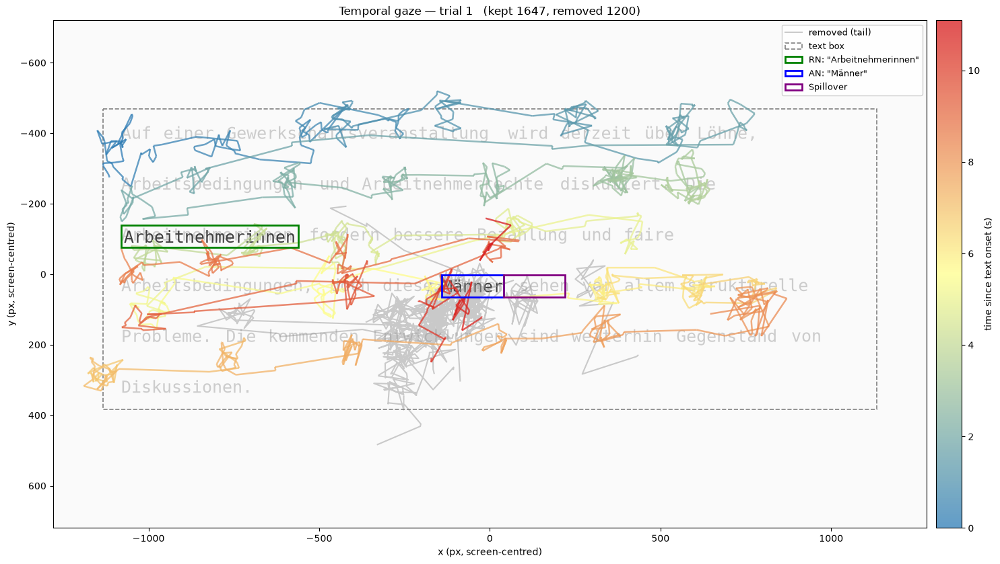

In [731]:
plot_gaze_with_time_gradient(0, min_run=7, max_gap=3, trigger_offset=500, manual=1200)

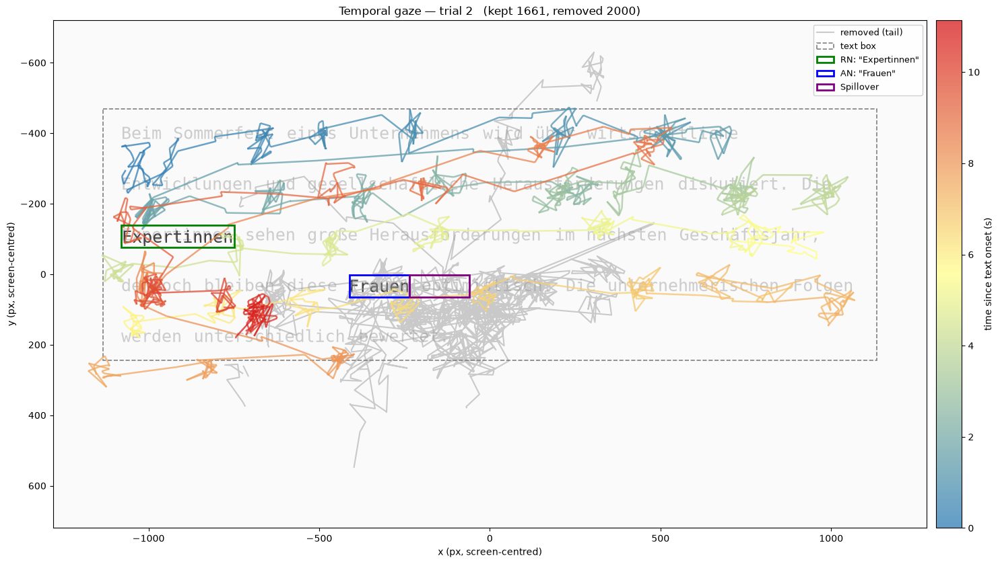

In [849]:
plot_gaze_with_time_gradient(1, min_run=10, max_gap=3, trigger_offset=500, manual=2000)

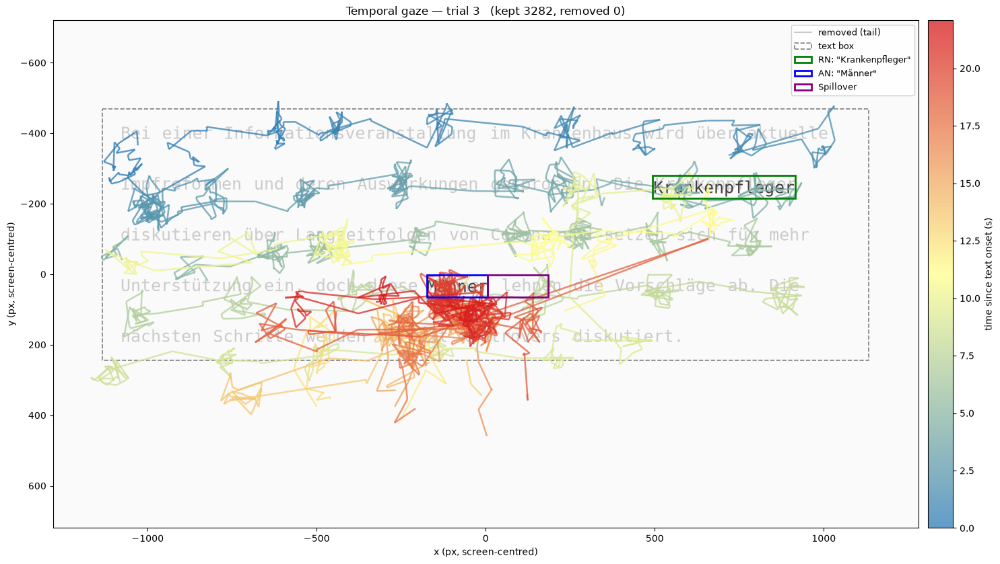

In [457]:
plot_gaze_with_time_gradient(2, min_run=5, max_gap=3, trigger_offset=500, manual=0)

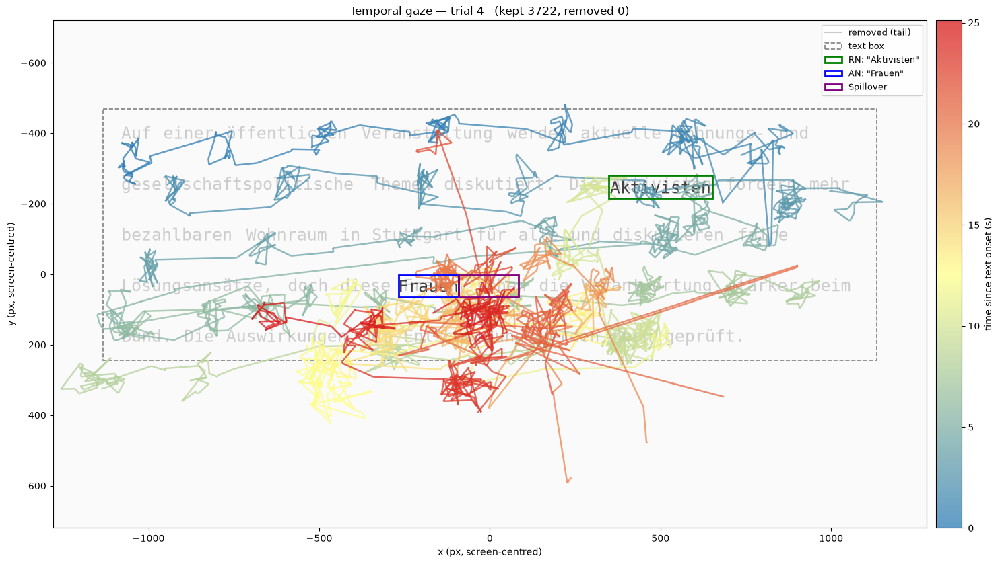

In [458]:
plot_gaze_with_time_gradient(3, min_run=5, max_gap=3, trigger_offset=500, manual=0)

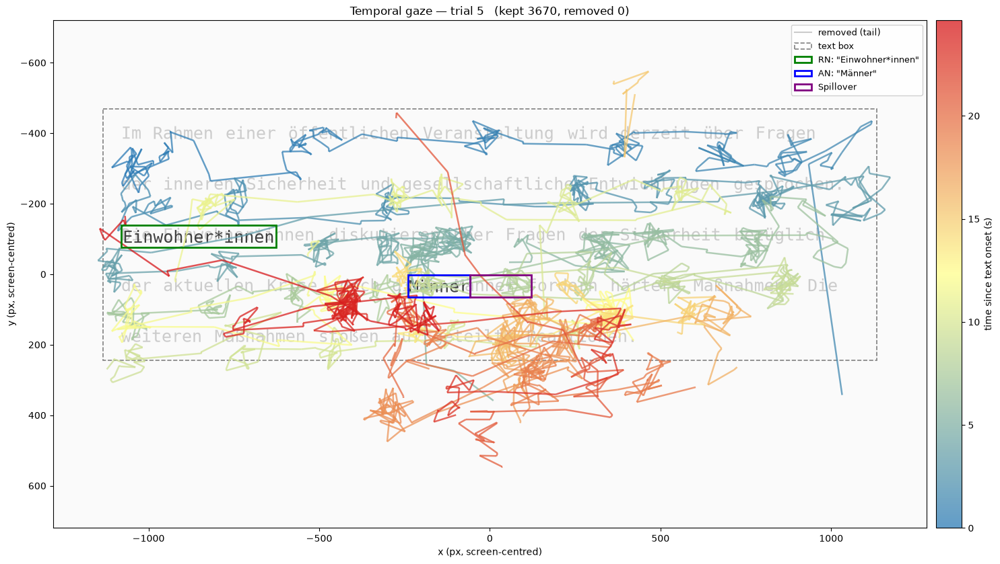

In [459]:
plot_gaze_with_time_gradient(4, min_run=7, max_gap=3, trigger_offset=500, manual=0)

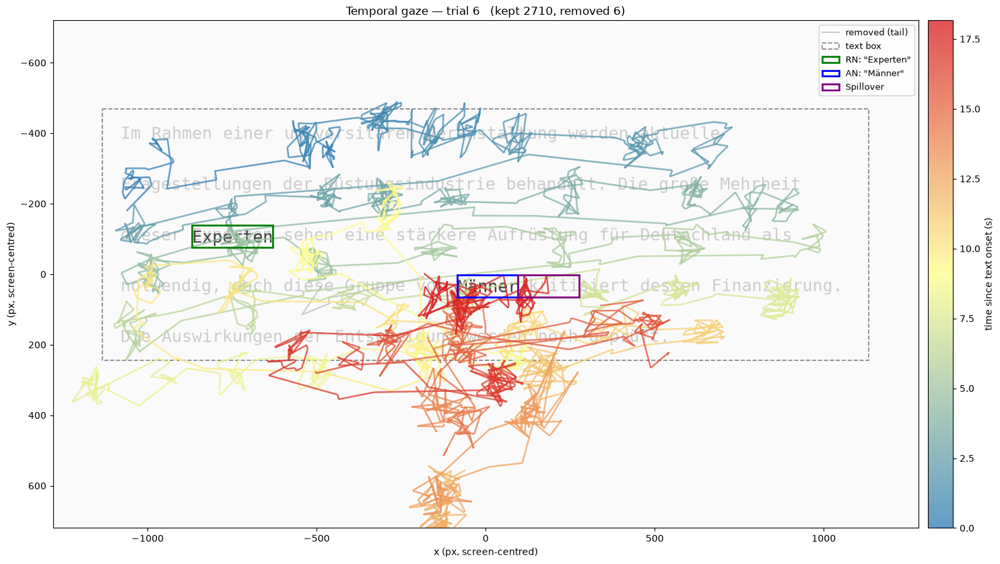

In [460]:
plot_gaze_with_time_gradient(5, min_run=7, max_gap=3, trigger_offset=500, manual=6)

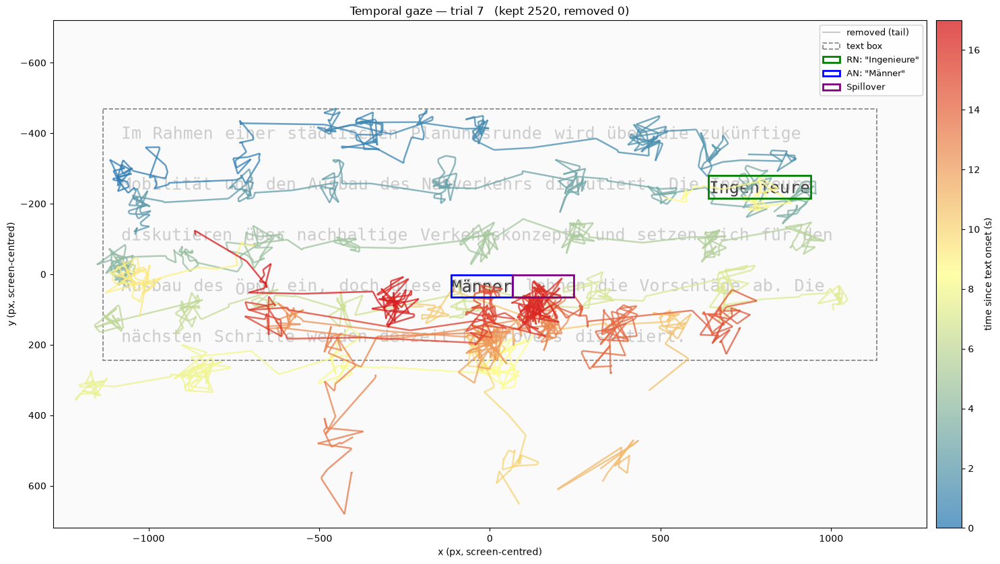

In [461]:
plot_gaze_with_time_gradient(6, min_run=7, max_gap=3, trigger_offset=500, manual=0)

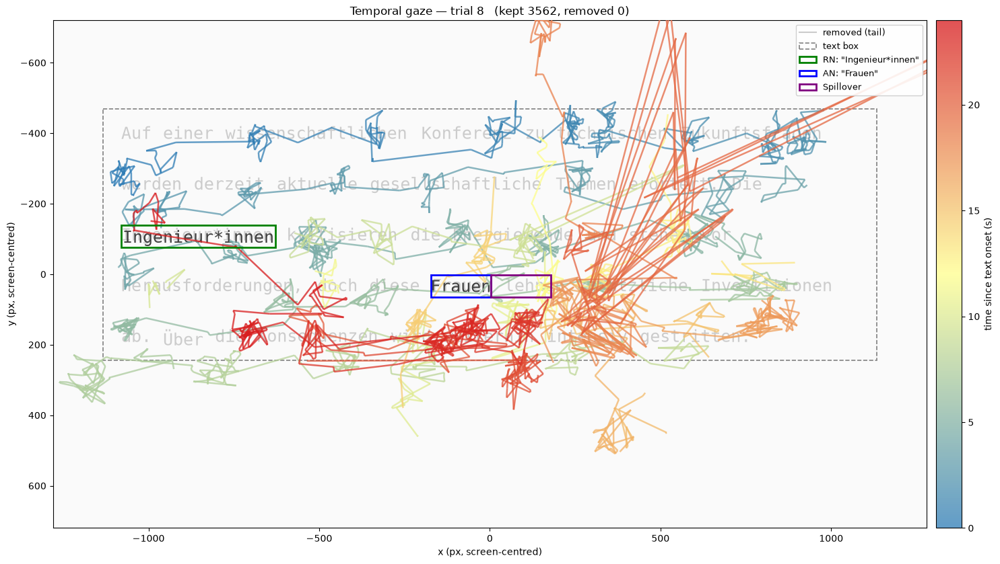

In [462]:
plot_gaze_with_time_gradient(7, min_run=7, max_gap=3, trigger_offset=500, manual=0)

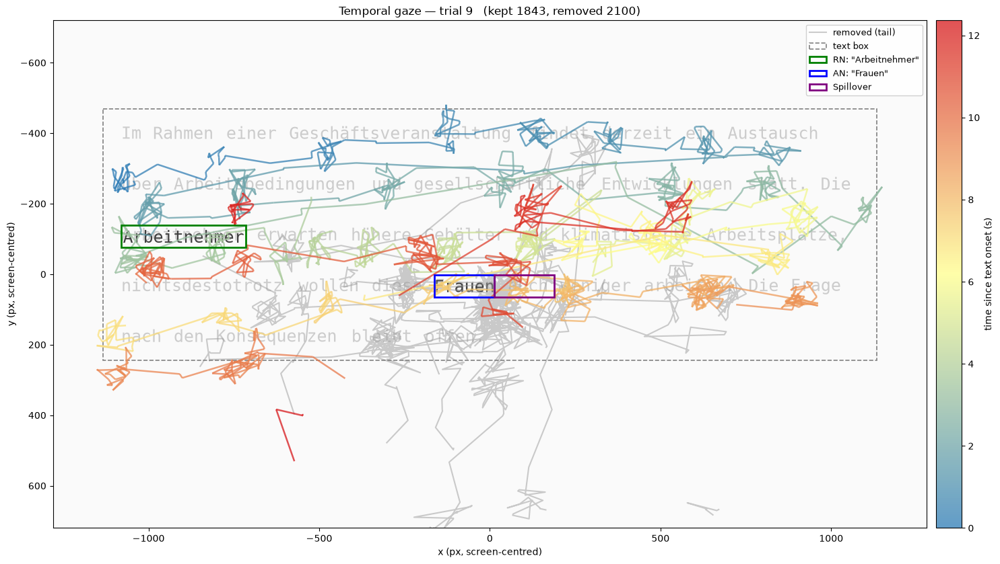

In [463]:
plot_gaze_with_time_gradient(8, min_run=7, max_gap=3, trigger_offset=500, manual=2100)

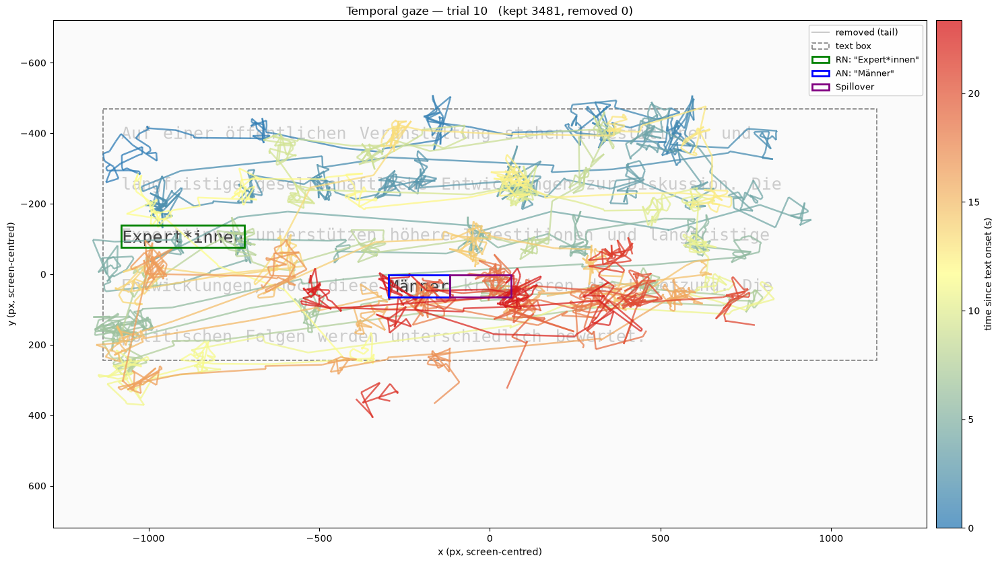

In [464]:
plot_gaze_with_time_gradient(9, min_run=7, max_gap=3, trigger_offset=500, manual=0)

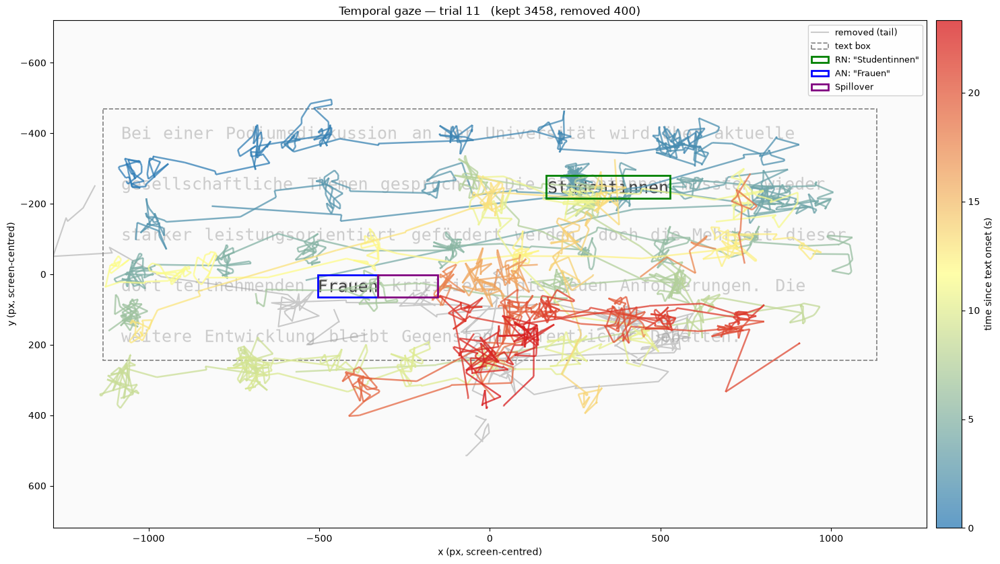

In [465]:
plot_gaze_with_time_gradient(10, min_run=7, max_gap=3, trigger_offset=150, manual=0)

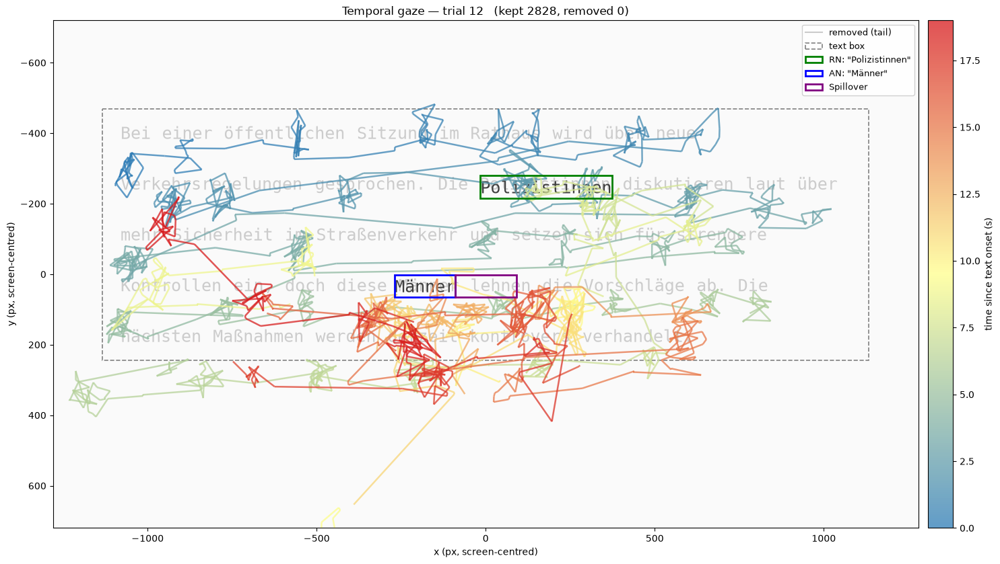

In [466]:
plot_gaze_with_time_gradient(11, min_run=7, max_gap=3, trigger_offset=500, manual=0)

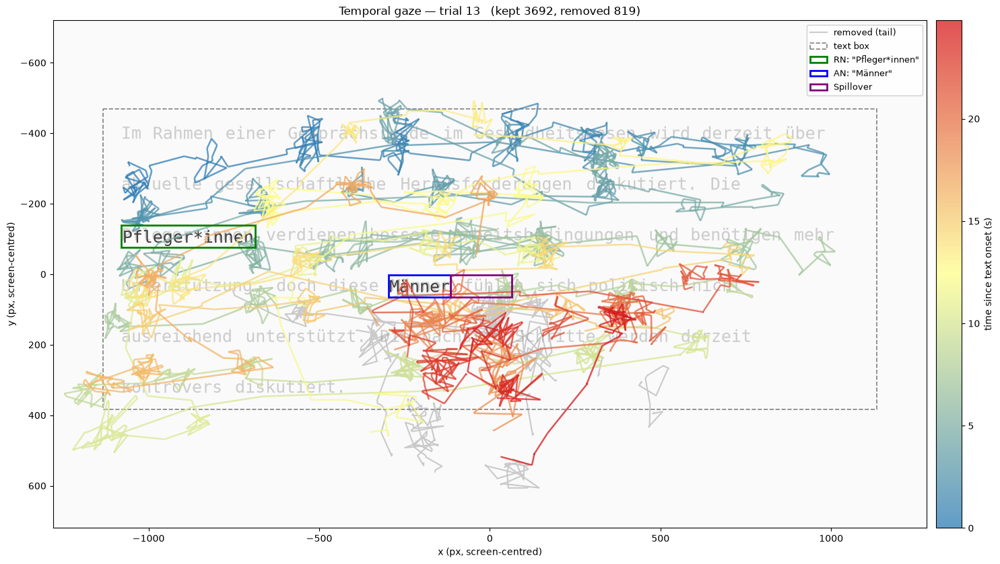

In [467]:
plot_gaze_with_time_gradient(12, min_run=7, max_gap=3, trigger_offset=150, manual=0)

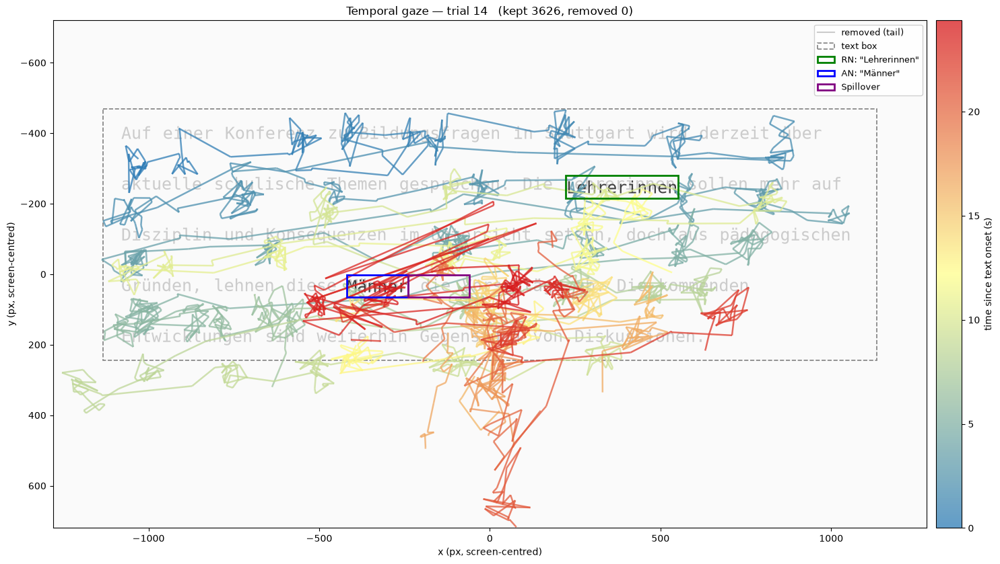

In [468]:
plot_gaze_with_time_gradient(13, min_run=7, max_gap=3, trigger_offset=500, manual=0)

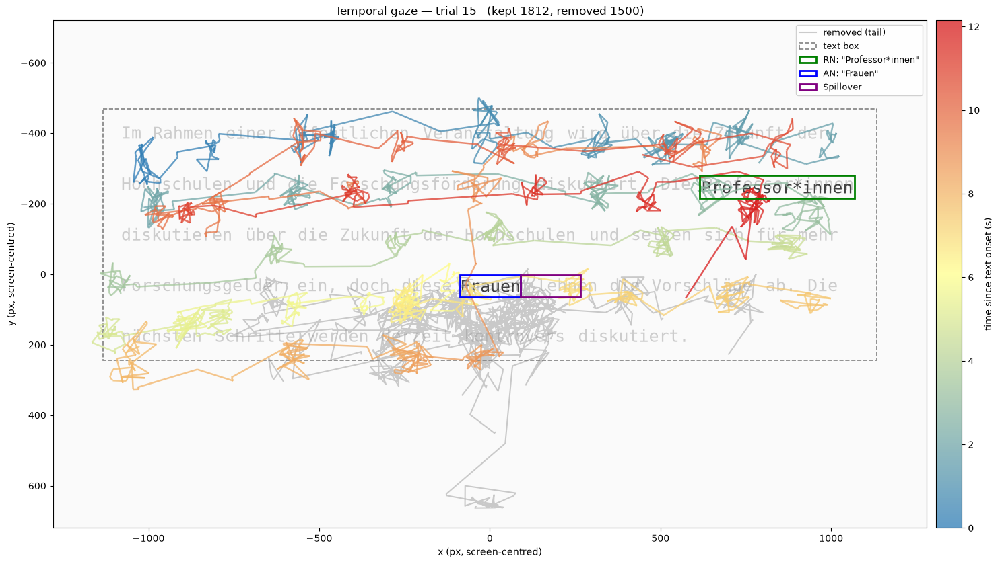

In [469]:
plot_gaze_with_time_gradient(14, min_run=7, max_gap=3, trigger_offset=500, manual=1500)

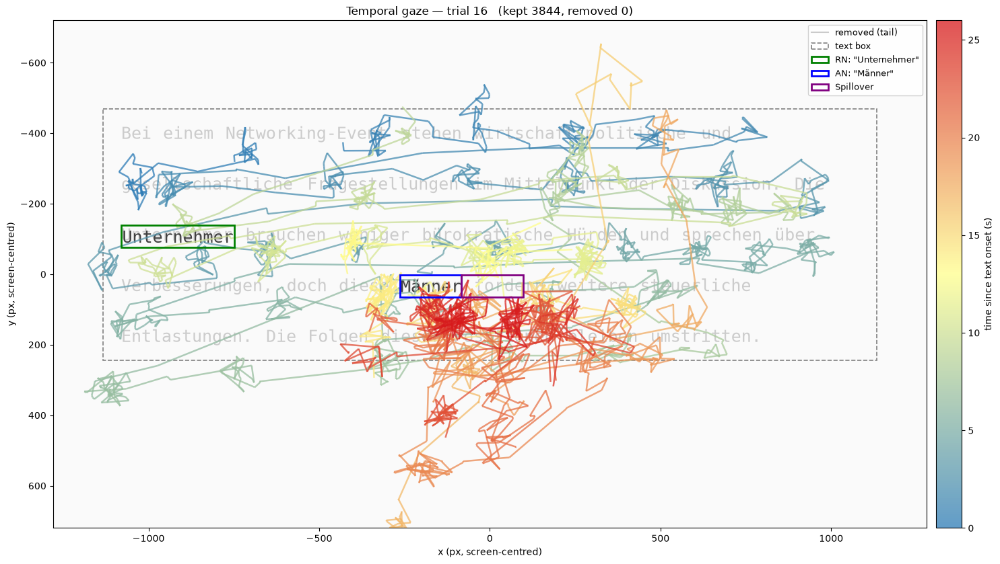

In [470]:
plot_gaze_with_time_gradient(15, min_run=7, max_gap=3, trigger_offset=500, manual=0)

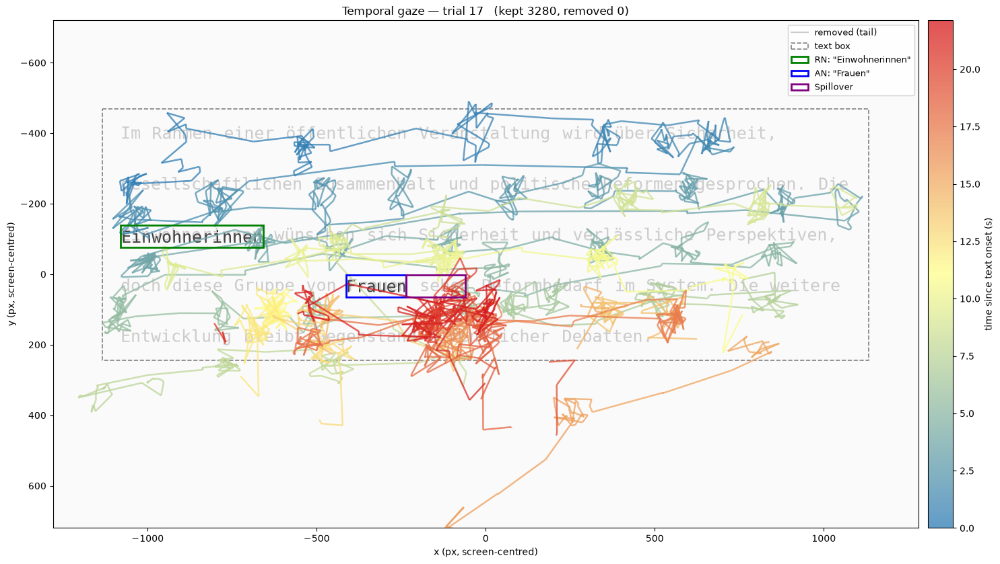

In [471]:
plot_gaze_with_time_gradient(16, min_run=7, max_gap=3, trigger_offset=500, manual=0)

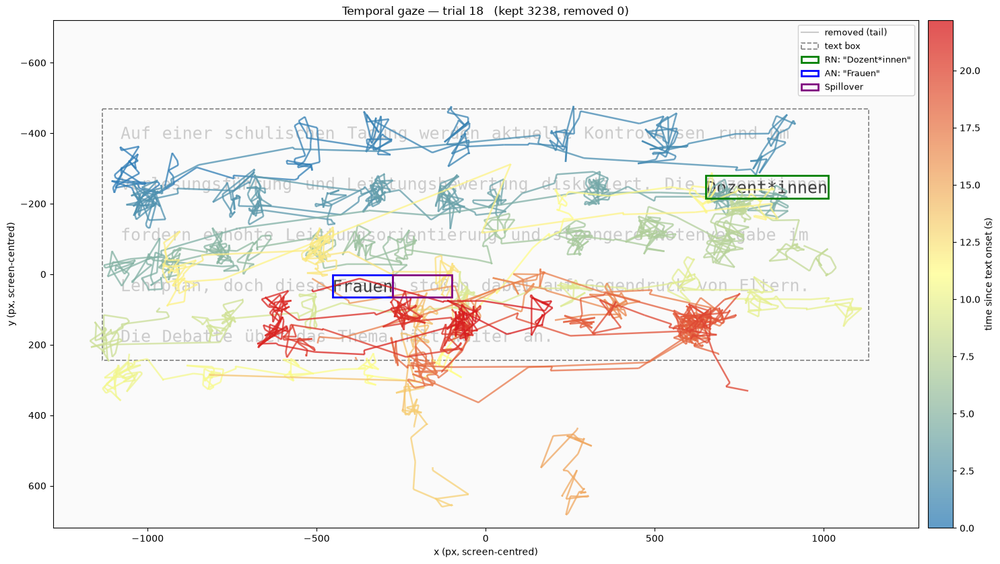

In [472]:
plot_gaze_with_time_gradient(17, min_run=7, max_gap=3, trigger_offset=500, manual=0)

In [473]:
sentence_df.head()

,CNT,TIME,TIME_TICK,FPOGX,FPOGY,FPOGS,FPOGD,FPOGID,FPOGV,LPOGX,...,USER,SENTENCE_INDEX,X_px,Y_px,X_px_center,Y_px_center,X_deg,Y_deg,segments,classes
0,607016,4125.56104,2268376986609,0.07651,0.27171,4125.26611,0.29492,9687,1,0.07441,...,SENTENCE_ONSET,0,165.8880,445.3920,-1114.1120,-274.6080,-23.410270,-6.219835,1,Fixation
1,607017,4125.56787,2268377054082,0.07623,0.27239,4125.26611,0.30176,9687,1,0.07213,...,NaN,0,162.3808,435.8880,-1117.6192,-284.1120,-23.476000,-6.433324,1,Fixation
2,607018,4125.57471,2268377120749,0.07583,0.27269,4125.26611,0.30859,9687,1,0.05927,...,NaN,0,147.0976,412.7040,-1132.9024,-307.2960,-23.761664,-6.953346,1,Fixation
3,607019,4125.58154,2268377188143,0.07545,0.27287,4125.26611,0.31543,9687,1,0.05820,...,NaN,0,147.7632,405.1152,-1132.2368,-314.8848,-23.749249,-7.123319,1,Fixation
4,607020,4125.58789,2268377255196,0.07510,0.27248,4125.26611,0.32178,9687,1,0.05820,...,NaN,0,147.7632,405.1152,-1132.2368,-314.8848,-23.749249,-7.123319,1,Fixation


# Analysis

In [515]:
# --- recode the mis-shown trial to the condition ACTUALLY shown ---
# trial 6 displayed: masculine RN (Ingenieure) + Männer  ==  C1 (match), not C2.
events_data_list4.loc[6, 'Code'] = 'C1'
# (leave AN as Männer — that's what was actually shown and now agrees with C1)

# --- condition maps ---
CODE_FORM  = {'C1':'masculine','C2':'masculine','C3':'feminine',
              'C4':'feminine','C5':'star','C6':'star'}
CODE_ANAPH = {'C1':'Männer','C2':'Frauen','C3':'Männer','C4':'Frauen','C5':'Männer','C6':'Frauen'}
CODE_MATCH = {'C1':'match','C2':'mismatch','C3':'mismatch','C4':'match','C5':'star','C6':'star'}

cond = events_data_list4.reset_index().rename(columns={'index':'trial'})[['trial','Code']]
cond['form']  = cond['Code'].map(CODE_FORM)
cond['anaph'] = cond['Code'].map(CODE_ANAPH)
cond['match'] = cond['Code'].map(CODE_MATCH)

an = rm[(rm.region=='AN') & rm.go_past.notna()].merge(cond, on='trial', how='left')

# --- per-condition means ---
order  = ['C1','C2','C3','C4','C5','C6']
labels = ['masc+M\n(match)','masc+F\n(mismatch)','fem+M\n(mismatch)',
          'fem+F\n(match)','star+M','star+F']
by_code = an.groupby('Code')['go_past'].agg(['mean','std','count']).reindex(order)
by_code['label'] = labels
print(by_code)

            mean         std  count               label
Code                                                   
C1    180.000000  261.788719      4     masc+M\n(match)
C2    180.000000  207.417989      2  masc+F\n(mismatch)
C3    513.333333  842.957756      3   fem+M\n(mismatch)
C4     33.333333   13.333333      3      fem+F\n(match)
C5    255.555556  316.742681      3              star+M
C6    186.666667  288.982891      3              star+F


/var/folders/t4/tpd64s9d2xb_cdt_fwtwlr480000gn/T/ipykernel_41396/715005107.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cond = events_data_list4.reset_index().rename(columns={'index':'trial'})[['trial','Code']]


In [527]:
# ---------- 1. reduce detected fixations to one centroid each ----------
def fixations_from_samples(trial, class_col='classes', x_col='X_px_center', y_col='Y_px_center',
                           fixation_label='Fixation', min_dur_ms=70, min_valid_frac=0.8,
                           sample_ms=1000/146.4):
    df = trial.reset_index(drop=True)
    is_fix = (df[class_col] == fixation_label).to_numpy()
    new_run = is_fix & ~np.r_[False, is_fix[:-1]]
    df = df.assign(_FIX_ID=np.where(is_fix, np.cumsum(new_run), np.nan))
    df['_valid'] = df[[x_col, y_col]].notna().all(axis=1)

    g = df[df['_FIX_ID'].notna()].groupby('_FIX_ID')
    fix = g.agg(x=(x_col,'mean'), y=(y_col,'mean'),
                t_start=('TIME','min'), t_end=('TIME','max'),
                n=('TIME','size'), n_valid=('_valid','sum')).reset_index(drop=True)

    fix['valid_frac'] = fix['n_valid'] / fix['n']
    fix['dur'] = fix['n_valid'] * sample_ms          # count only VALID samples as duration
    fix = fix[(fix['valid_frac'] >= min_valid_frac) &   # kill track-loss "fixations"
              (fix['dur'] >= min_dur_ms)]
    fix = fix.dropna(subset=['x','y'])
    return fix.sort_values('t_start').reset_index(drop=True)

In [732]:
def drop_thinking_fixations(fix, max_reading_dur=700, gap_tol=1):
    """Drop the TERMINAL run of thinking fixations (abnormally long, at trial end).
    Walks back from the last fixation; stops at the first plausible reading fixation.
    Returns fix with an 'is_thinking' bool column (non-destructive)."""
    fix = fix.reset_index(drop=True).copy()
    fix['is_thinking'] = False
    if fix.empty:
        return fix
    i, short_run = len(fix) - 1, 0
    while i >= 0:
        if fix.loc[i, 'dur'] > max_reading_dur:
            fix.loc[i, 'is_thinking'] = True
            short_run = 0
        else:
            short_run += 1
            if short_run > gap_tol:      # hit real reading -> stop walking back
                break
            fix.loc[i, 'is_thinking'] = True   # tolerate a short fixation inside the run
        i -= 1
    return fix

In [960]:
def trial_measures(fix, row, sx, sy, line_sp=117.0, pad_px=30, max_lines_ahead=0):  # pad with 30 pixels

    LINE_W = 1e5    # the space reserved for each line for 1D alignment
    fx = fix['x'].to_numpy(float); fy = fix['y'].to_numpy(float); dur = fix['dur'].to_numpy(float)
    n_lines = round((float(row['last_line_y'])-float(row['text_start_y']))/line_sp)+1
    line_ys = (float(row['text_start_y']) + np.arange(n_lines)*line_sp) * sy
    sline = np.argmin(np.abs(fy[:,None]-line_ys[None,:]), axis=1) if len(fx) else np.array([],int)
    pos = sline*LINE_W + fx
    out = {}

    for name in ['rn','an','spill']:
        x1,x2 = float(row[f'{name}_x1'])*sx, float(row[f'{name}_x2'])*sx
        y1,y2 = float(row[f'{name}_y1'])*sy, float(row[f'{name}_y2'])*sy
        # add the padding
        x1, x2 = x1 - pad_px, x2 + pad_px
        y1, y2 = y1 - pad_px, y2 + pad_px
        
        # find the line number for the target word
        rline = int(round((float(row[f'{name}_y1'])-float(row['text_start_y']))/line_sp))

        # find the in region fixations
        inreg = (fx>=x1)&(fx<=x2)&(fy>=y1)&(fy<=y2)

        # find the edges under the 1D representation
        right_edge = rline*LINE_W + x2
        left_edge = rline*LINE_W + x1

        # if no in region fixation at all, return nan
        if not inreg.any():
            out[name] = dict(first_pass=np.nan, total=np.nan, go_past=np.nan,
                             regression_out=np.nan, regression_in=np.nan, n_fix=0); continue

        # find the index of the first instance when inreg==True
        entry = int(np.argmax(inreg))

        gp_limit   = (rline+max_lines_ahead+1)*LINE_W
       
        # --- first pass ---
        fp_end: int = entry
        while fp_end < len(fx) and inreg[fp_end]:
            fp_end += 1
            
        first_pass=dur[entry:fp_end].sum()

        # --- go past ---
        gp_end = entry
        while gp_end < len(fx):
            if inreg[gp_end]:
                # If we are still inside the First-Pass box, Go-Past MUST keep counting.
                gp_end += 1 
            elif pos[gp_end] <= right_edge and pos[gp_end] < gp_limit:
                # If we left the box to the left (regression), keep counting.
                gp_end += 1 
            else:
                # We definitively crossed the right edge, or went too far down. Stop!
                break 
        go_past=dur[entry:gp_end].sum()

        # --- regression-out ---
        regression_out = int(bool((pos[entry:gp_end] < left_edge).any()))
        # # quick stupid fix
        # if first_pass == go_past:
        #     regression_out = 0

        # --- regression-in ---
        # use the UNPADDED right edge for direction tests
        right_edge_true = rline*LINE_W + (float(row[f'{name}_x2'])*sx)

        # regression-in: an entry that occurs AFTER the eye first went past the region
        first_past = int(np.argmax(pos > right_edge_true)) if (pos > right_edge_true).any() else len(fx)
        regression_in = 0
        for idx in np.where(inreg)[0]:
            if idx > first_past:            # this entry happened after the eye moved on
                regression_in = 1
                break


        out[name] = dict(first_pass=first_pass,
                         total=dur[inreg].sum(),
                         go_past=go_past,
                         regression_out=regression_out,
                         regression_in=regression_in,
                         n_fix=int(inreg.sum()))
    return out

def build_all_measures(sentence_df, events_df, cond, sx, sy, pad_px=7, max_lines_ahead=0):
    rows = []
    for i, trial in sentence_df.groupby('SENTENCE_INDEX'):
        row = events_df.iloc[i]
        fix = fixations_from_samples(trial.sort_values('TIME'))
        if fix.empty: continue
        fix = drop_thinking_fixations(fix)
        n_thinking = int(fix['is_thinking'].sum())
        fix = fix[~fix['is_thinking']].reset_index(drop=True)   # reading fixations only
        if fix.empty: continue
        m = trial_measures(fix, row, sx, sy, pad_px=pad_px, max_lines_ahead=max_lines_ahead)
        for region, vals in m.items():
            rows.append(dict(trial=i, region=region.upper(), n_thinking=n_thinking, **vals))
    return pd.DataFrame(rows).merge(cond, on='trial', how='left')

sx, sy = RESOLUTION[0]/WRONG_RES[0], RESOLUTION[1]/WRONG_RES[1]
M = build_all_measures(sentence_df, events_data_list4, cond, sx, sy)
print(M.groupby('region')[['first_pass','total','go_past','n_fix']].mean().round(0))

        first_pass  total  go_past  n_fix
region                                   
AN           195.0  326.0    195.0    1.0
RN           258.0  361.0    282.0    2.0
SPILL        214.0  354.0    236.0    1.0


In [961]:
past = pos > right_edge_true
k = 3
sust = past.copy()
for j in range(1, k):
    sust &= np.r_[past[j:], np.zeros(j, bool)]
first_past = int(np.argmax(sust)) if sust.any() else len(fx)

In [962]:
M = build_all_measures(sentence_df, events_data_list4, cond, sx, sy)
print(M.groupby('trial')['n_thinking'].first())     # how many dropped per trial

trial
0     1
1     1
2     1
3     1
4     1
5     1
6     1
7     1
8     1
9     1
10    1
11    1
12    1
13    1
14    1
15    1
16    1
17    1
Name: n_thinking, dtype: int64


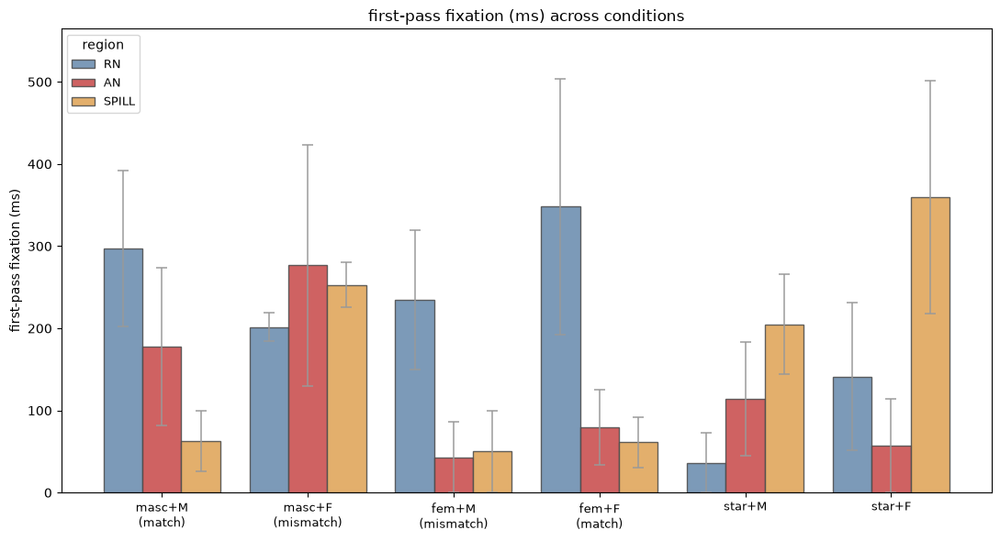

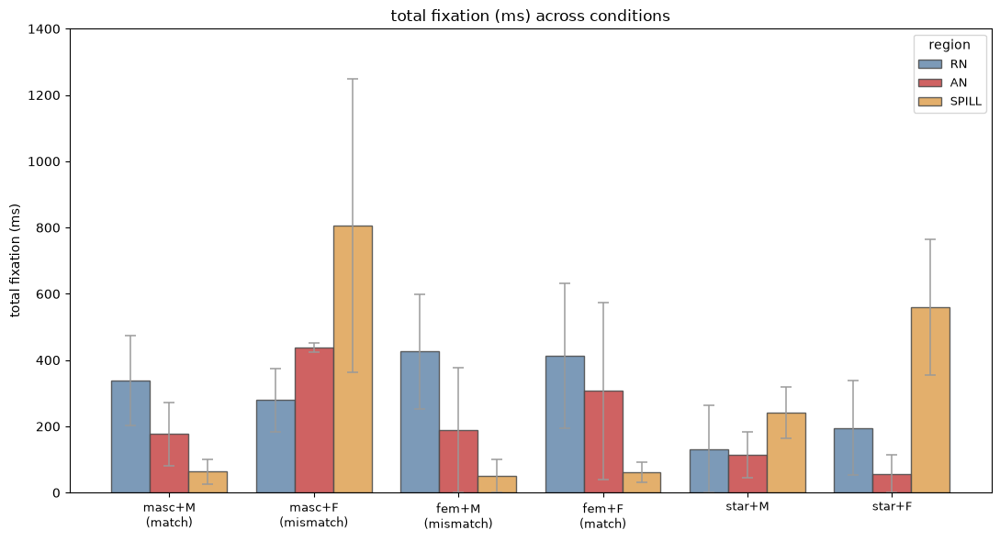

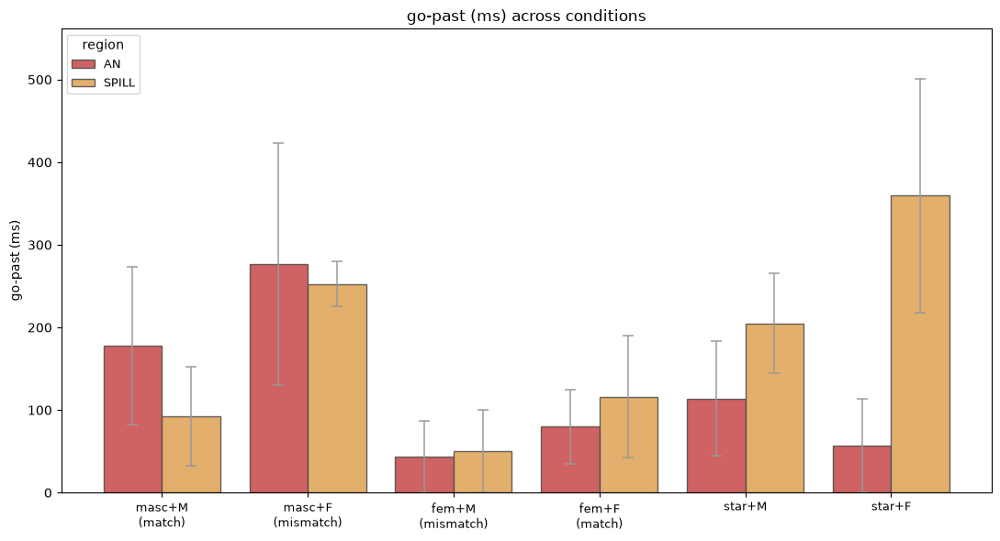

In [ ]:
def plot_measure(M, measure, regions=('AN','SPILL'), exclude_trials=()):
    order  = ['C1','C2','C3','C4','C5','C6']
    labels = ['masc+M\n(match)','masc+F\n(mismatch)','fem+M\n(mismatch)',
              'fem+F\n(match)','star+M','star+F']
              
    # 1. Grab the valid trials (using .copy() to avoid Pandas warnings)
    d = M[~M.trial.isin(exclude_trials)].copy()
    
    # 2. THE OVERRIDE: Force all missing data (NaN) in this measure to become 0
    d[measure] = d[measure].fillna(0)
    
    # Calculate Means and Standard Error 
    piv = d.pivot_table(index='Code', columns='region', values=measure, aggfunc='mean').reindex(order)
    err = d.pivot_table(index='Code', columns='region', values=measure, aggfunc='sem').reindex(order)
    

    rcolors = {'RN':'#6a8caf','AN':'#c94c4c','SPILL':'#e0a458'}
    x = np.arange(len(order)); w = 0.8/len(regions)
    fig, ax = plt.subplots(figsize=(11,6))
    
    for j,reg in enumerate(regions):
        vals = piv[reg].values if reg in piv else np.full(len(order), np.nan)
        err_vals = err[reg].values if reg in err else np.full(len(order), np.nan)
        off = (j-(len(regions)-1)/2)*w
        
        # 4. Draw the bars with standard error whiskers!
        # (NEW CODE)
        ax.bar(x+off, vals, w, yerr=err_vals, capsize=4, label=reg, 
               color=rcolors.get(reg,'0.5'), edgecolor='0.3', alpha=0.88,
               error_kw={'ecolor': '0.6', 'elinewidth': 1.2, 'capthick': 1.2, 'alpha': 0.9})
               
    ax.set_xticks(x); ax.set_xticklabels(labels, fontsize=9)
    ylab = {'first_pass':'first-pass fixation (ms)','total':'total fixation (ms)',
            'go_past':'go-past (ms)','regression_out':'regression-out prob.',
            'regression_in':'regression-in prob.'}.get(measure, measure)
    ax.set_ylabel(ylab)
    ax.set_title(f'{ylab} across conditions')
    ax.legend(title='region', fontsize=9); ax.margins(y=0.12)
    plt.tight_layout(); plt.show()

for meas in ['first_pass','total']:
    plot_measure(M, meas, regions=('RN','AN','SPILL'))
plot_measure(M, 'go_past', regions=('AN','SPILL'))

In [964]:
# per trial, where does first_past fire, and how many fixations precede it?
for i, trial in sentence_df.groupby('SENTENCE_INDEX'):
    row = events_data_list4.iloc[i]
    fix = fixations_from_samples(trial.sort_values('TIME'))
    if fix.empty: continue
    fx, fy = fix['x'].to_numpy(), fix['y'].to_numpy()
    n_lines = round((float(row['last_line_y'])-float(row['text_start_y']))/117.0)+1
    line_ys = (float(row['text_start_y']) + np.arange(n_lines)*117.0)*sy
    sline = np.argmin(np.abs(fy[:,None]-line_ys[None,:]), axis=1)
    pos = sline*1e5 + fx
    rline = int(round((float(row['an_y1'])-float(row['text_start_y']))/117.0))
    right_edge_true = rline*1e5 + float(row['an_x2'])*sx
    past = pos > right_edge_true
    fp = int(np.argmax(past)) if past.any() else len(fx)
    print(f"trial {i}: {len(fix)} fix, first_past at {fp} ({fp/len(fix):.0%} through)")

trial 0: 61 fix, first_past at 22 (36% through)
trial 1: 85 fix, first_past at 31 (36% through)
trial 2: 75 fix, first_past at 27 (36% through)
trial 3: 76 fix, first_past at 19 (25% through)
trial 4: 78 fix, first_past at 30 (38% through)
trial 5: 76 fix, first_past at 26 (34% through)
trial 6: 54 fix, first_past at 25 (46% through)
trial 7: 71 fix, first_past at 21 (30% through)
trial 8: 75 fix, first_past at 29 (39% through)
trial 9: 84 fix, first_past at 28 (33% through)
trial 10: 64 fix, first_past at 20 (31% through)
trial 11: 61 fix, first_past at 24 (39% through)
trial 12: 95 fix, first_past at 34 (36% through)
trial 13: 72 fix, first_past at 28 (39% through)
trial 14: 76 fix, first_past at 20 (26% through)
trial 15: 73 fix, first_past at 17 (23% through)
trial 16: 66 fix, first_past at 20 (30% through)
trial 17: 84 fix, first_past at 31 (37% through)


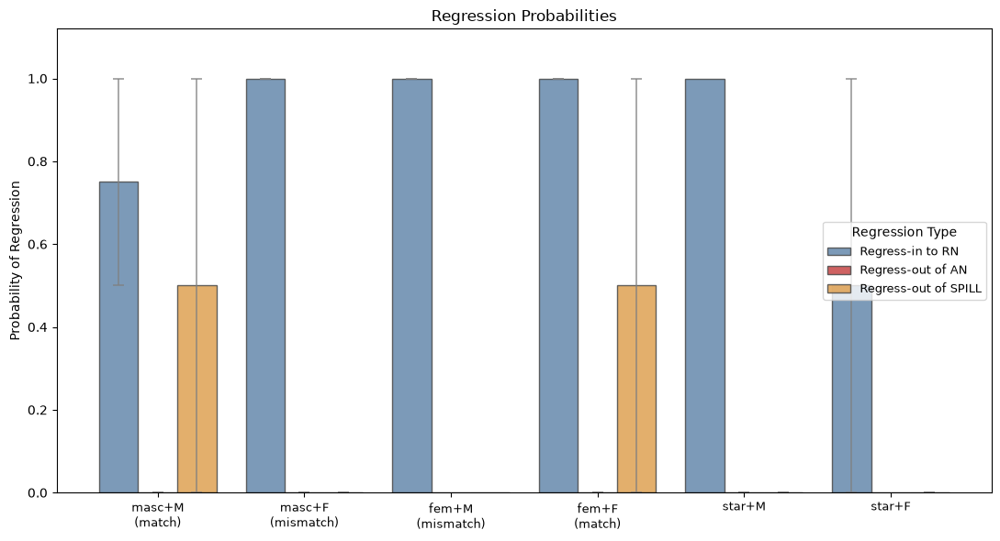

In [965]:
def plot_regression_pattern(M, exclude_trials=()):
    """
    Plots the full regression journey with standard error bars:
    1. Regressing IN to the Role Noun
    2. Regressing OUT of the Anaphor
    3. Regressing OUT of the Spillover
    """
    order  = ['C1','C2','C3','C4','C5','C6']
    labels = ['masc+M\n(match)','masc+F\n(mismatch)','fem+M\n(mismatch)',
              'fem+F\n(match)','star+M','star+F']
    
    # Filter out excluded trials
    d = M[~M.trial.isin(exclude_trials)]

    # --- 1. Extract MEANS ---
    rn_in = d[(d.region == 'RN') & d.regression_in.notna()].pivot_table(
        index='Code', values='regression_in', aggfunc='mean').reindex(order)['regression_in']

    an_out = d[(d.region == 'AN') & d.regression_out.notna()].pivot_table(
        index='Code', values='regression_out', aggfunc='mean').reindex(order)['regression_out']

    spill_out = d[(d.region == 'SPILL') & d.regression_out.notna()].pivot_table(
        index='Code', values='regression_out', aggfunc='mean').reindex(order)['regression_out']

    # --- 2. Extract ERRORS (Standard Error) ---
    rn_in_err = d[(d.region == 'RN') & d.regression_in.notna()].pivot_table(
        index='Code', values='regression_in', aggfunc='sem').reindex(order)['regression_in']

    an_out_err = d[(d.region == 'AN') & d.regression_out.notna()].pivot_table(
        index='Code', values='regression_out', aggfunc='sem').reindex(order)['regression_out']

    spill_out_err = d[(d.region == 'SPILL') & d.regression_out.notna()].pivot_table(
        index='Code', values='regression_out', aggfunc='sem').reindex(order)['regression_out']

    # --- 3. Package them together (Label, Mean Data, Error Data, Color) ---
    series_data = [
        ('Regress-in to RN', rn_in, rn_in_err, '#6a8caf'),
        ('Regress-out of AN', an_out, an_out_err, '#c94c4c'),
        ('Regress-out of SPILL', spill_out, spill_out_err, '#e0a458')
    ]

    # --- Plotting Geometry ---
    x = np.arange(len(order))
    w = 0.8 / len(series_data) # Dynamically size the bars
    
    fig, ax = plt.subplots(figsize=(11, 6))
    
    # Notice we unpack 'errs' here now too
    for j, (label, vals, errs, color) in enumerate(series_data):
        # Calculate the offset so bars sit next to each other
        off = (j - (len(series_data) - 1) / 2) * w
        
        # Draw the bar with the error values and the custom light-gray formatting!
        ax.bar(x + off, vals.values, w, 
               yerr=errs.values, capsize=4, 
               label=label, color=color, edgecolor='0.3', alpha=0.88,
               error_kw={'ecolor': '0.5', 'elinewidth': 1.2, 'capthick': 1.2, 'alpha': 0.8})

    # Styling
    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=9)
    ax.set_ylabel('Probability of Regression')
    ax.set_title('Regression Probabilities')
    ax.legend(title='Regression Type', fontsize=9)
    ax.margins(y=0.12)
    
    plt.tight_layout()
    plt.show()

# How to run it:
plot_regression_pattern(M)

In [966]:
def clean(s): return re.sub(r'</?[^>]+>', '', str(s))

# pull each region's measures into wide columns, one row per trial
wide = M.pivot_table(index='trial', columns='region',
                     values=['first_pass','total','go_past','regression_out', 'regression_in', 'n_fix'])
wide.columns = [f'{reg}_{meas}' for meas, reg in wide.columns]   # e.g. AN_go_past
wide = wide.reset_index()

info = events_data_list4.reset_index().rename(columns={'index':'trial'})[['trial','Code','RN','AN']].copy()
info['RN'] = info['RN'].map(clean); info['AN'] = info['AN'].map(clean)
info['form']  = info['Code'].map(CODE_FORM)
info['match'] = info['Code'].map(CODE_MATCH)

per_sentence = info.merge(wide, on='trial', how='left')
# show the key columns, ordered by trial
show = ['trial','Code','form','match','RN','AN',
        'RN_first_pass','RN_total', 'RN_regression_in',
        'AN_first_pass','AN_total','AN_go_past','AN_regression_out',
        'SPILL_first_pass','SPILL_total','SPILL_go_past','RN_n_fix', 'AN_n_fix', 'SPILL_n_fix']
print(per_sentence[show].round(0).to_string(index=False))

 trial Code      form    match                RN     AN  RN_first_pass  RN_total  RN_regression_in  AN_first_pass  AN_total  AN_go_past  AN_regression_out  SPILL_first_pass  SPILL_total  SPILL_go_past  RN_n_fix  AN_n_fix  SPILL_n_fix
     0   C3  feminine mismatch Arbeitnehmerinnen Männer          232.0     232.0               1.0          130.0     567.0       130.0                0.0             150.0        150.0          150.0       1.0       3.0          1.0
     1   C4  feminine    match       Expertinnen Frauen          150.0     150.0               1.0          157.0     840.0       157.0                0.0              89.0         89.0          253.0       1.0       6.0          1.0
     2   C1 masculine    match    Krankenpfleger Männer          581.0     745.0               1.0          437.0     437.0       437.0                0.0             116.0        116.0          116.0       3.0       2.0          1.0
     3   C2 masculine mismatch        Aktivisten Frauen         

/var/folders/t4/tpd64s9d2xb_cdt_fwtwlr480000gn/T/ipykernel_41396/1204191734.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  info = events_data_list4.reset_index().rename(columns={'index':'trial'})[['trial','Code','RN','AN']].copy()


In [967]:
allfix = pd.concat([fixations_from_samples(t) for _,t in sentence_df.groupby('SENTENCE_INDEX')])
print(allfix['dur'].describe().round(1))
print("under 70ms:", (allfix['dur']<70).sum())        # should be 0
print("over 800ms:", (allfix['dur']>800).sum())       # merge too aggressive?
print("fixations per trial:", len(allfix)/sentence_df['SENTENCE_INDEX'].nunique())

count    1326.0
mean      160.0
std        78.1
min        75.1
25%        95.6
50%       143.4
75%       198.1
max       642.1
Name: dur, dtype: float64
under 70ms: 0
over 800ms: 0
fixations per trial: 73.66666666666667


In [968]:
# are the >800ms fixations at the end of trials?
long_fix = allfix[allfix['dur'] > 800]
# compare their t_start to each trial's time range
print(long_fix)

Empty DataFrame
Columns: [x, y, t_start, t_end, n, n_valid, valid_frac, dur]
Index: []


In [969]:
# for each trial, where does the first >600ms fixation sit in the sequence?
for i, trial in sentence_df.groupby('SENTENCE_INDEX'):
    f = fixations_from_samples(trial.sort_values('TIME'))
    long_idx = np.where(f['dur'].to_numpy() > 600)[0]
    if len(long_idx):
        print(f"trial {i}: {len(f)} fixations, first long at index {long_idx[0]} "
              f"({long_idx[0]/len(f):.0%} through), n_long={len(long_idx)}")

trial 0: 61 fixations, first long at index 17 (28% through), n_long=1
trial 3: 76 fixations, first long at index 16 (21% through), n_long=1
trial 7: 71 fixations, first long at index 21 (30% through), n_long=1


In [970]:
# for one long fixation, look at the underlying samples
long1 = allfix[allfix['dur'] > 600].iloc[0]
seg = sentence_df[(sentence_df['TIME'] >= long1['t_start']) & (sentence_df['TIME'] <= long1['t_end'])]
print("n samples:", len(seg))
print("NaN fraction:", seg[['X_px_center','Y_px_center']].isna().any(axis=1).mean())
print("x spread (px):", seg['X_px_center'].max() - seg['X_px_center'].min())
print("y spread (px):", seg['Y_px_center'].max() - seg['Y_px_center'].min())

## long "fixations" are track-loss stretches being labelled as fixations

n samples: 107
NaN fraction: 0.14018691588785046
x spread (px): 1694.8224
y spread (px): 345.24000000000007


In [971]:
i = 0
fix = fixations_from_samples(sentence_df[sentence_df.SENTENCE_INDEX==i].sort_values('TIME'))
# rebuild sline as in trial_measures, then:
print(sline[:40])          # should look like 0,0,0,...,1,1,1,...,2,2,2,...

[1 1 1 0 0 0 0 0 0 0 0 2 2 1 1 2 2 1 1 2 1 1 1 3 3 3 3 3 2 2 2 3 2 2 2 2 2
 3 2 2]


In [972]:
i = 0
fix = fixations_from_samples(sentence_df[sentence_df.SENTENCE_INDEX==i].sort_values('TIME'))
fx, fy = fix['x'].to_numpy(), fix['y'].to_numpy()
row = events_data_list4.iloc[i]
n_lines = round((float(row['last_line_y'])-float(row['text_start_y']))/117.0)+1
line_ys = (float(row['text_start_y']) + np.arange(n_lines)*117.0)*sy
sline = np.argmin(np.abs(fy[:,None]-line_ys[None,:]), axis=1)
print("snapped lines:", sline[:40])
print("fixation y  :", fy[:40].round(0))
print("line targets:", line_ys.round(0))

snapped lines: [1 0 0 0 0 0 0 0 0 0 1 2 1 1 1 1 1 2 2 2 2 2 4 3 3 3 3 3 3 3 5 5 5 4 4 4 4
 4 3 3]
fixation y  : [-346. -354. -368. -393. -432. -445. -471. -450. -407. -440. -284. -203.
 -247. -275. -268. -257. -275. -193.  -83.  -89. -133. -104.   90.   44.
   48.   46.   38.   34.   55.   38.  280.  238.  221.  200.  194.  161.
  101.   91.  -36.  -48.]
line targets: [-420. -280. -139.    1.  142.  282.]
